In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [ ]:
!pip3 uninstall keras-nightly
!pip3 install h5py==2.10.0
# instalacja poprzednich wersji tensorflow i keras
%tensorflow_version 1.x
import tensorflow
!pip3 uninstall keras
!pip install q keras==2.2.4
import keras

TensorFlow 1.x selected.
Found existing installation: Keras 2.2.4
Uninstalling Keras-2.2.4:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/Keras-2.2.4.dist-info/*
    /usr/local/lib/python3.7/dist-packages/docs/*
    /usr/local/lib/python3.7/dist-packages/keras/*
  Would not remove (might be manually added):
    /usr/local/lib/python3.7/dist-packages/docs/md_autogen.py
    /usr/local/lib/python3.7/dist-packages/docs/update_docs.py
Proceed (y/n)? y
  Successfully uninstalled Keras-2.2.4
  Using cached Keras-2.2.4-py2.py3-none-any.whl (312 kB)


Using TensorFlow backend.


In [ ]:
print(tensorflow.__version__, tensorflow.test.is_gpu_available())
print(keras.__version__)

1.15.2 True
2.2.4


In [ ]:
# pobranie mask rcnn
!git clone https://github.com/matterport/Mask_RCNN.git

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 29.84 MiB/s, done.
Resolving deltas: 100% (565/565), done.


In [ ]:
# instalacja mask rcnn
%cd Mask_RCNN
!python setup.py install

/content/Mask_RCNN
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writin

In [ ]:
!pip3 show mask-rcnn

Name: mask-rcnn
Version: 2.1
Summary: Mask R-CNN for object detection and instance segmentation
Home-page: https://github.com/matterport/Mask_RCNN
Author: Matterport
Author-email: waleed.abdulla@gmail.com
License: MIT
Location: /usr/local/lib/python3.7/dist-packages/mask_rcnn-2.1-py3.7.egg
Requires: 
Required-by: 


In [ ]:
# biblioteki
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes
from mrcnn.utils import Dataset
import mrcnn.config

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import glob
import cv2 as cv
import numpy as np
import os
import random
from imgaug import augmenters as iaa
from sklearn.model_selection import train_test_split
from skimage.draw import polygon

# podłączenie dysku google
from google.colab.patches import cv2_imshow 
from google.colab import drive
drive._mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# wyswietlenie informacji o zbiorach
def print_data_info(set):
    print('**************************')
    print('Set len:', len(set.image_ids))
    for i, id in enumerate(set.image_ids):
      info_train = set.image_info[id]
      print(info_train)
      show_img_with_mask(set, id)
      if i == 5:
        break


# skalowanie obrazow
def img_scale(img, scale):
    # pobranie wymiarow, ich modyfikacja
    h = int(img.shape[0] * scale)
    w = int(img.shape[1] * scale)
    dim = (w, h)
    # zwrocenie przeskalowanego obrazu interpolowanego okreslona metoda
    return cv.resize(img, dim, interpolation=cv.INTER_LANCZOS4)


# zwrocenie obrazu z nalozona maska
def show_img_with_mask(set, id):
    img = set.load_image(id)
    mask, class_id = set.load_mask(id)
    box = extract_bboxes(mask)
    display_instances(img, box, mask, class_id, set.class_names)

In [ ]:
# foldery z danymi
folder_with_data = '/content/drive/MyDrive/DOTA/Dataset'
loc_of_model = '/content/drive/MyDrive/DOTA/Out_model/sat_aerial_object_detection20211001T1246/mask_rcnn_sat_aerial_object_detection_0155.h5'
loc_of_out_model = '/content/drive/MyDrive/DOTA/Out_model'

train_images_dir = folder_with_data + '/Train/mod/images'
train_annotations_dir = folder_with_data + '/Train/mod/annots'

In [ ]:
# stworzenie list X - dane (obrazy) y - adnotacje
def create_dataset(all_images_folder, all_annots_folder, folder_number):
  X = []
  y = []
  all_images = glob.glob(all_images_folder + f'{folder_number}/*.png')
  all_annots = glob.glob(all_annots_folder + f'{folder_number}/*.txt')
  print(len(all_images))
  print(len(all_annots))

  for annot in all_annots:
    annot_file_name = os.path.basename(annot).replace('.txt', '')
    for image in all_images:
      image_file_name = os.path.basename(image).replace('.png', '')
      if annot_file_name == image_file_name:
        X.append(image)
        y.append(annot)
        break
  return X, y

In [ ]:
X_train = []
y_train = []

for i in range(10):
  X_train_temp, y_train_temp = create_dataset(train_images_dir, train_annotations_dir, folder_number=i)
  X_train += X_train_temp
  y_train += y_train_temp

2461
2461
2445
2445
2385
2385
2459
2459
2438
2438
2479
2479
2430
2430
2410
2410
2437
2437
2503
2503


In [ ]:
X_val = []
y_val = []

for i in range(10, 14):
  X_val_temp, y_val_temp = create_dataset(train_images_dir, train_annotations_dir, folder_number=i)
  X_val += X_val_temp
  y_val += y_val_temp

2386
2386
2459
2459
2337
2337
2417
2417


In [ ]:
def check_0_annots(y):
  size_0 = 0
  for ann in y:
    if os.path.getsize(ann) == 0:
      size_0 += 1
  return size_0

In [ ]:
print(check_0_annots(y_train), check_0_annots(y_val))

342 120


In [ ]:
print(len(X_train), len(y_train))
print(X_train[0:100])
print(y_train[0:100])
print(X_train[-100:-1])
print(y_train[-100:-1])

24447 24447
['/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2162_8.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2156_3.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2122_6.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2122_7.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2210_5.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2210_35.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2247_7.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2269_6.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2269_11.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2264_7.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2264_9.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2118_0.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2142_3.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2370_5.png', '/content/drive/MyD

In [ ]:
print(len(X_val), len(y_val))
print(X_val[0:100])
print(y_val[0:100])
print(X_val[-100:-1])
print(y_val[-100:-1])

9599 9599
['/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2199_6.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2250_24.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2250_32.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2189_4.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_0.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_4.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_6.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_7.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_13.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2080_2.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2224_24.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2224_31.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2224_37.png', '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2224_46.png', '/

In [ ]:
class Dota_data_set(Dataset):
  # zaladowanie zbioru danych -> dokumentacja mask rcnn
    def load_dataset(self, is_train):
        self.add_class('object', 0, 'plane')
        self.add_class('object', 1, 'ship')
        self.add_class('object', 2, 'storage-tank')
        self.add_class('object', 3, 'baseball-diamond')
        self.add_class('object', 4, 'tennis-court')
        self.add_class('object', 5, 'basketball-court')
        self.add_class('object', 6, 'ground-track-field')
        self.add_class('object', 7, 'harbor')
        self.add_class('object', 8, 'bridge')
        self.add_class('object', 9, 'large-vehicle')
        self.add_class('object', 10, 'small-vehicle')
        self.add_class('object', 11, 'helicopter')
        self.add_class('object', 12, 'roundabout')
        self.add_class('object', 13, 'soccer-ball-field')
        self.add_class('object', 14, 'swimming-pool')
        self.add_class('object', 15, 'container-crane')

        if is_train is True:
          for i in range(len(X_train)):
            self.add_image('object', image_id=os.path.basename(X_train[i]).replace('.png', ''), path=X_train[i], annotation=y_train[i])
        elif is_train is False:
          for i in range(len(X_val)):
            self.add_image('object', image_id=os.path.basename(X_val[i]).replace('.png', ''), path=X_val[i], annotation=y_val[i])


    # uzyskanie wspolrzednych prostokatow
    def extract_boxes(self, file_name):
        boxes = []
        class_ids = []
        all_lines = open(file_name).readlines()
        
        if len(all_lines) > 0:
          if len(all_lines[0].split(' ')) == 10:
            first_line = 0
          else:
            first_line = 2
          
          for line in all_lines[first_line:]:
            x1, y1, x2, y2, x3, y3, x4, y4, class_name, _ = line.split(' ')
            assert len(line.split(' ')) == 10
            boxes.append(((int(float(x1)), int(float(y1))), (int(float(x2)), int(float(y2))), (int(float(x3)), int(float(y3))), (int(float(x4)), int(float(y4)))))
            class_ids.append(class_name)        
          assert len(boxes) == len(class_ids)
          return boxes, class_ids
        else:
          return [], []


    # zaladowanie pelnej maski
    def load_mask(self, image_id):
        # info o danym obrazie
        info = self.image_info[image_id]
        h, w, c = cv.imread(info['path']).shape
        path = info['annotation']
        # ladowanie pliku
        boxes, class_ids_ = self.extract_boxes(path)
        # maska -> ma wymiary jak obraz, kazdy obiekt znajduje się w kolejnej przestrzeni
        class_ids = []
        masks = np.zeros([h, w, len(boxes)], dtype='uint8')
        for i in range(len(boxes)):
            poly = np.array(boxes[i])
            rr, cc = polygon(poly[:,1], poly[:,0], masks.shape)
            masks[rr, cc, i] = 1
            class_ids.append(self.class_names.index(class_ids_[i]))
        return masks, np.asarray(class_ids, dtype='int32')


    # zwraca info o obrazie
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']


# konfiguracja do detekcji - https://medium.com/geoai/reconstructing-3d-buildings-from-aerial-lidar-with-ai-details-6a81cb3079c0
class SA_config(Config):
    NAME = "sat_aerial_object_detection"
    BACKBONE = 'resnet101'
    GPU_COUNT = 1
    NUM_CLASSES = 1 + 16
    DETECTION_MIN_CONFIDENCE = 0.68
    STEPS_PER_EPOCH = 1000
    BATCH_SIZE = 1
    IMAGES_PER_GPU = 1
    VALIDATION_STEPS = 80
    RPN_ANCHOR_SCALES = (10, 20, 40, 80, 160)
    TRAIN_ROIS_PER_IMAGE = 700
    DETECTION_MAX_INSTANCES = 1600

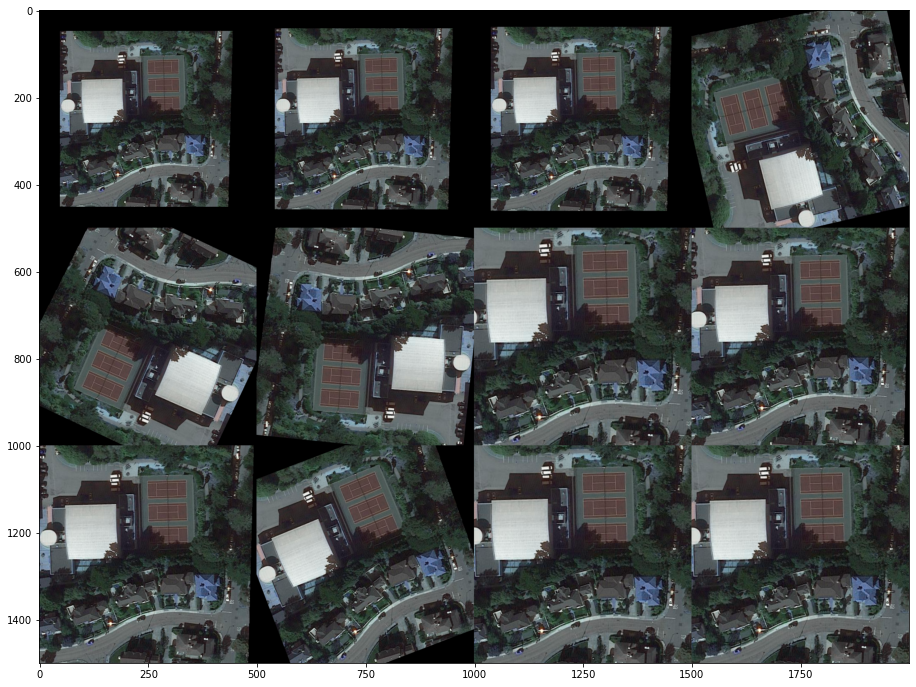

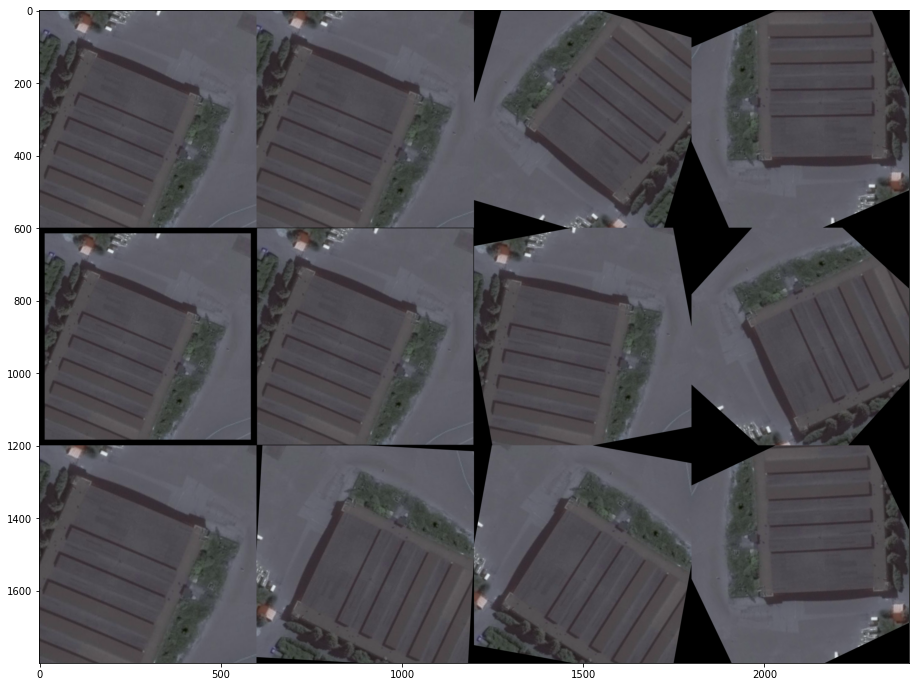

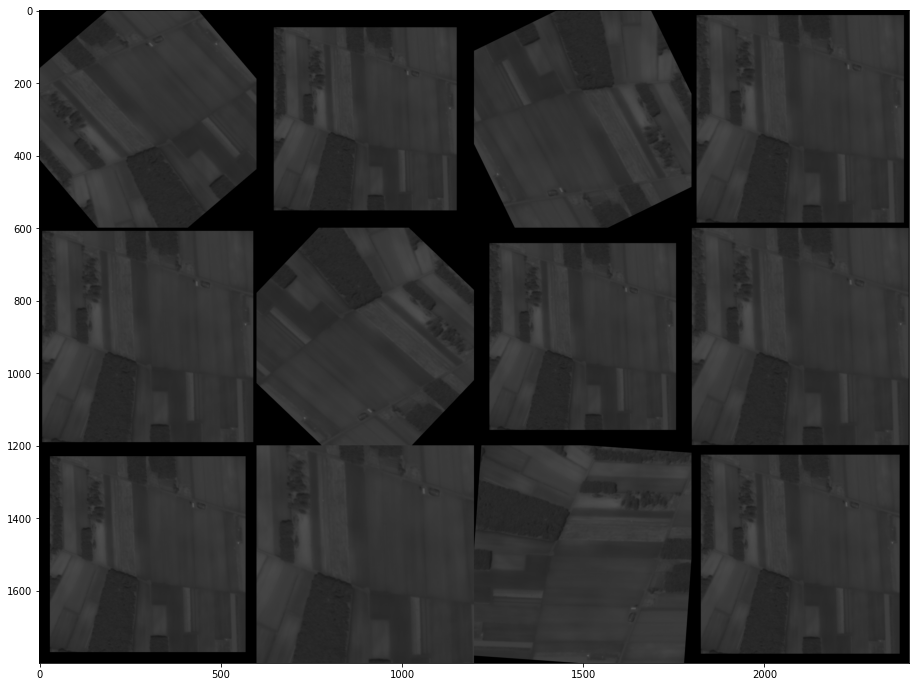

In [ ]:
# augmentacja wprowadzona zostanie do 50% obrazów
# źródło: https://imgaug.readthedocs.io/en/latest/source/examples_basics.html

augmentation = iaa.Sequential(
                                iaa.OneOf([
                                iaa.Affine(rotate=(-180, 180)), 
                                iaa.Affine(scale=(0.8, 1.2))
                                ]))


for _ in range(3):
  random_value = random.randint(0, len(X_train))
  imggrid = augmentation.draw_grid(cv.imread(X_train[random_value]), cols=4, rows=3)
  plt.figure(figsize=(30, 12))
  _ = plt.imshow(imggrid.astype(int))

**************************
Set len: 24447
{'id': 'P2162_8', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2162_8.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2162_8.txt'}


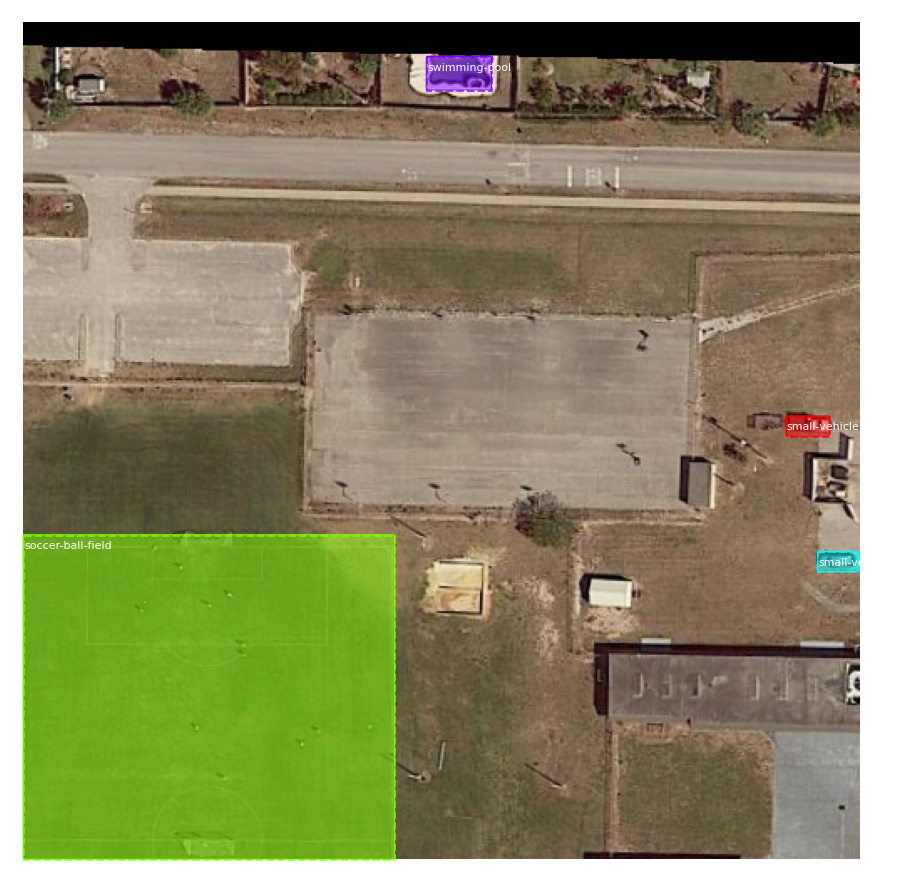

{'id': 'P2156_3', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2156_3.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2156_3.txt'}


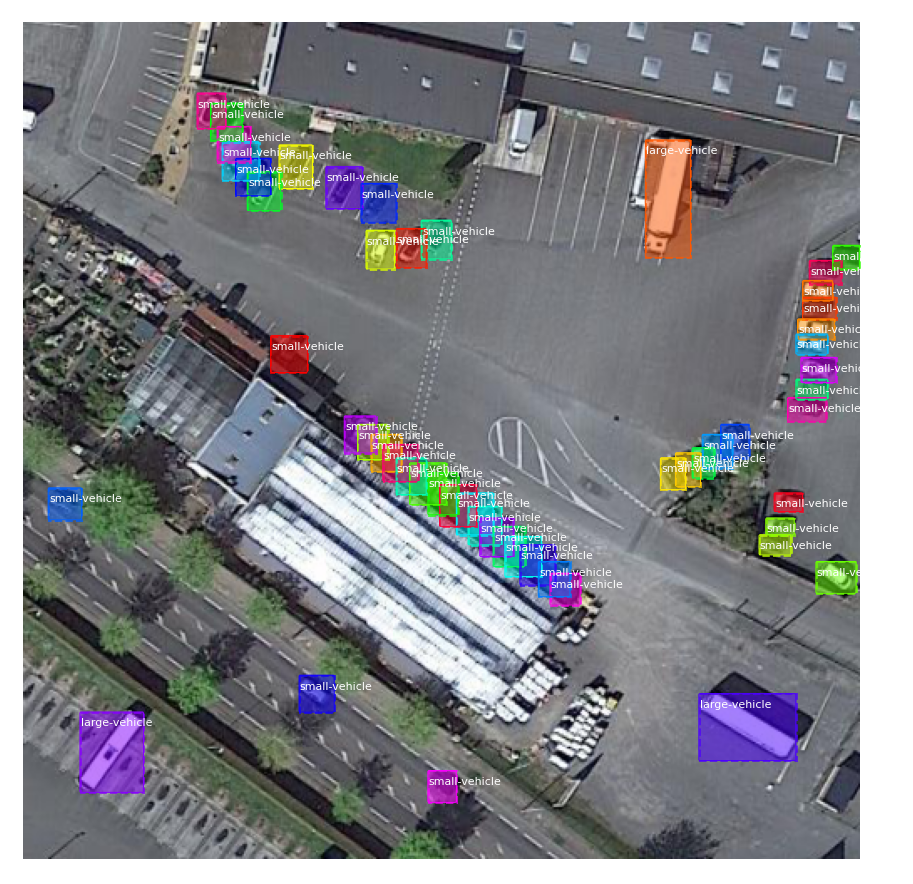

{'id': 'P2122_6', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2122_6.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2122_6.txt'}


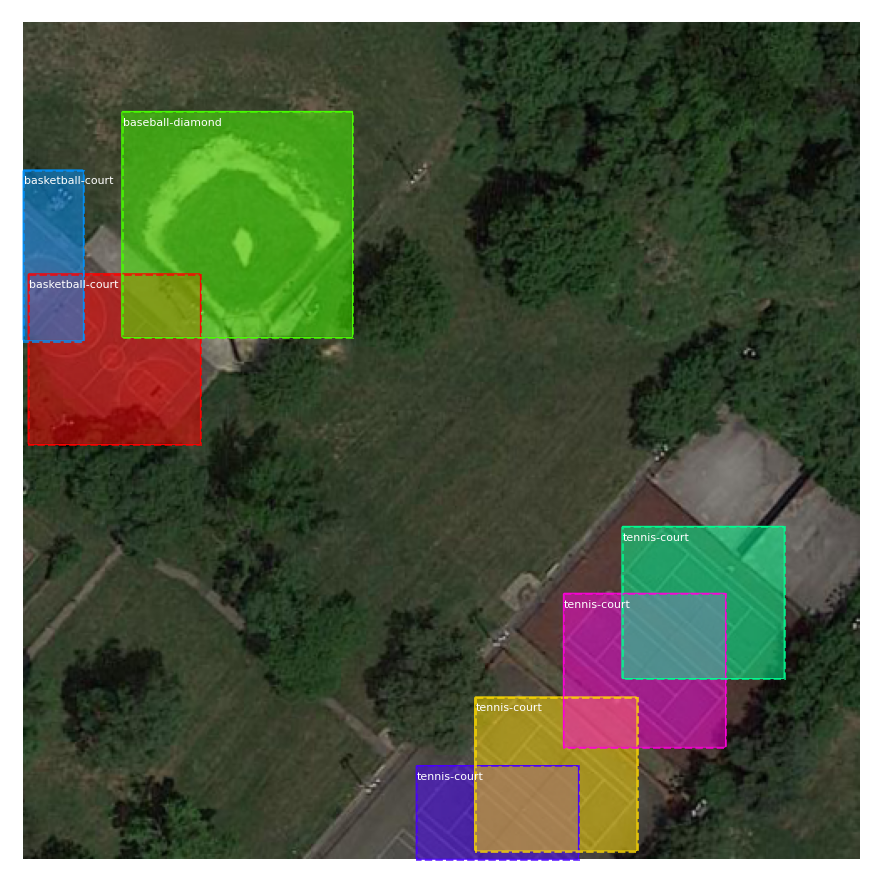

{'id': 'P2122_7', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2122_7.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2122_7.txt'}


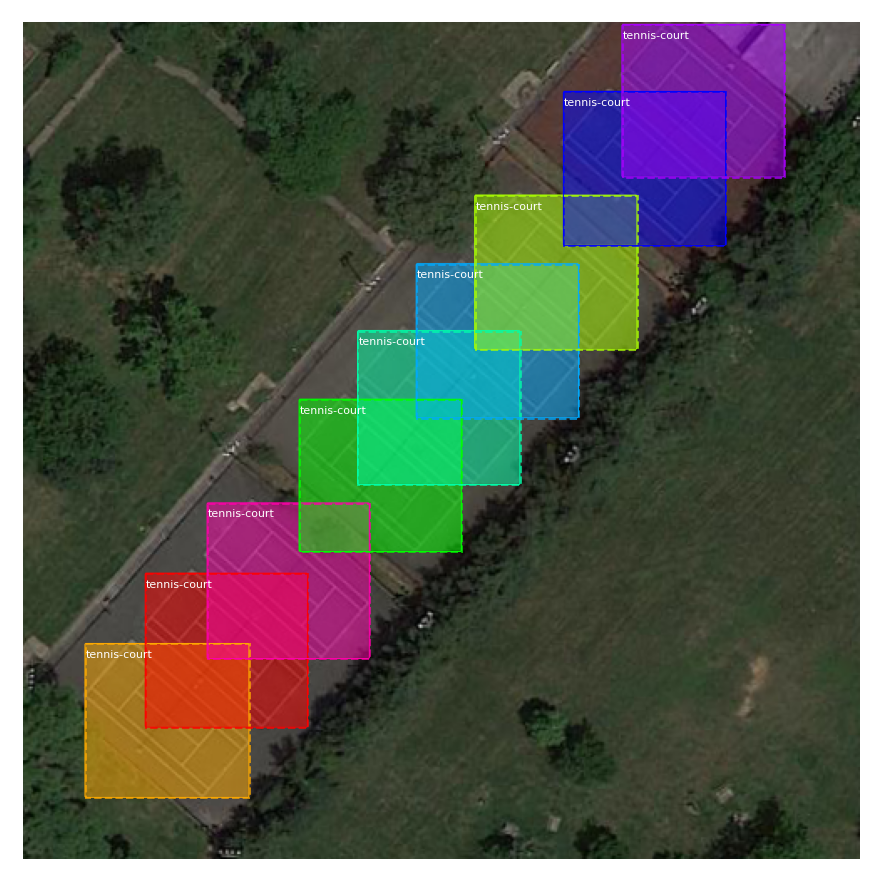

{'id': 'P2210_5', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2210_5.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2210_5.txt'}


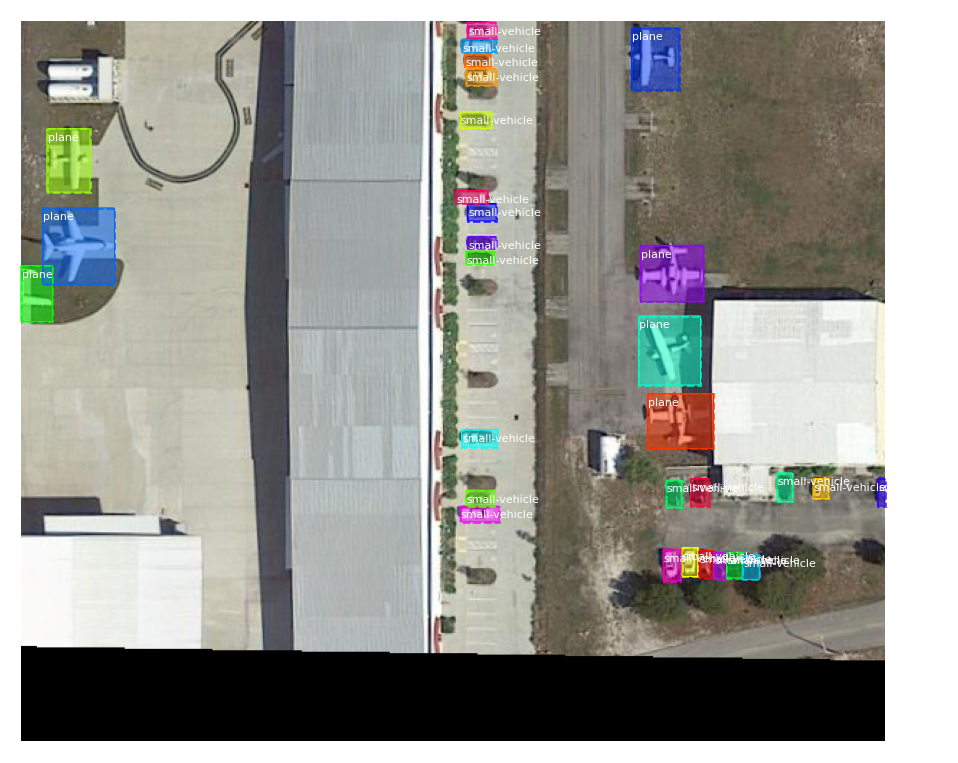

{'id': 'P2210_35', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images0/P2210_35.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots0/P2210_35.txt'}


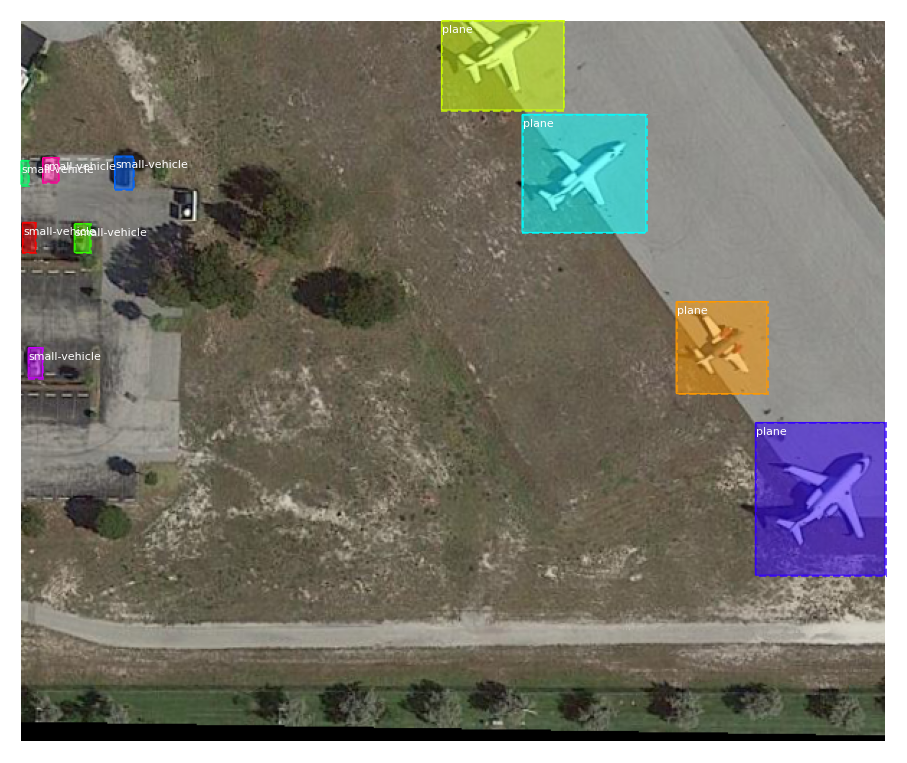

**************************
Set len: 9599
{'id': 'P2199_6', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2199_6.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2199_6.txt'}


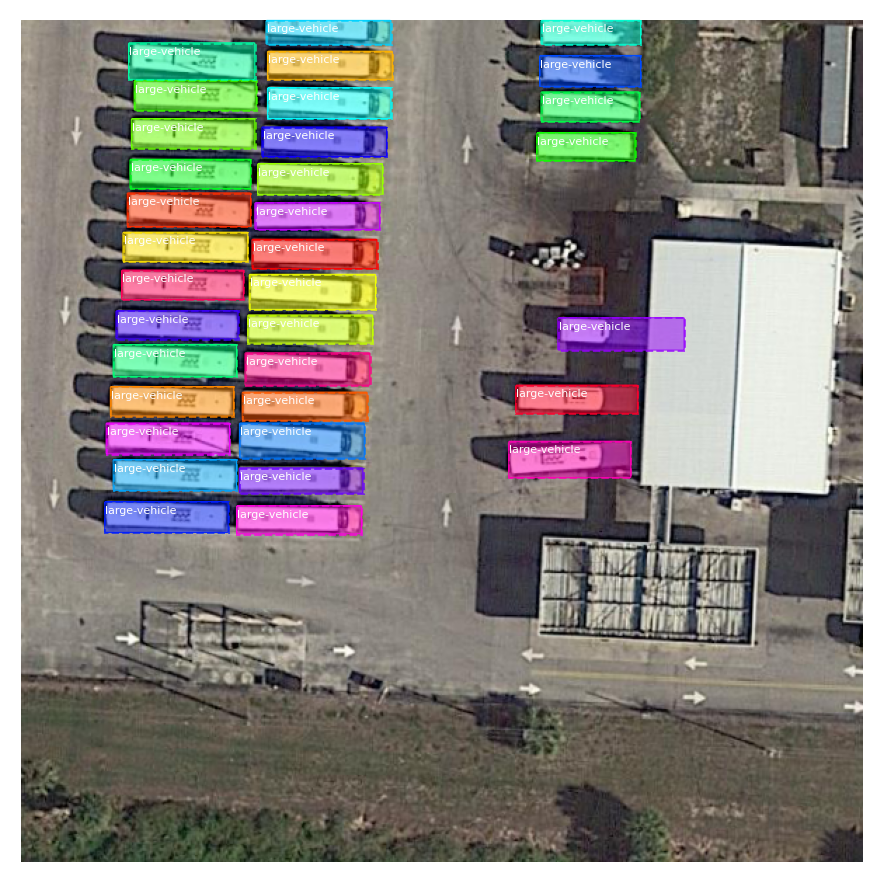

{'id': 'P2250_24', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2250_24.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2250_24.txt'}


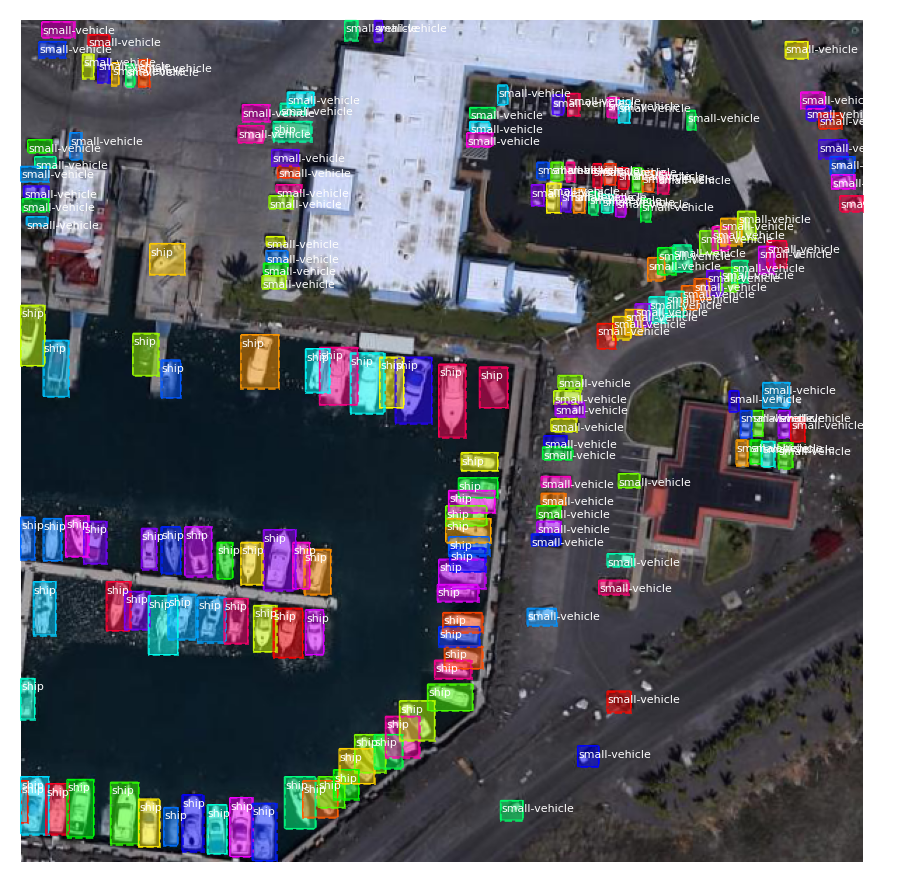

{'id': 'P2250_32', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2250_32.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2250_32.txt'}


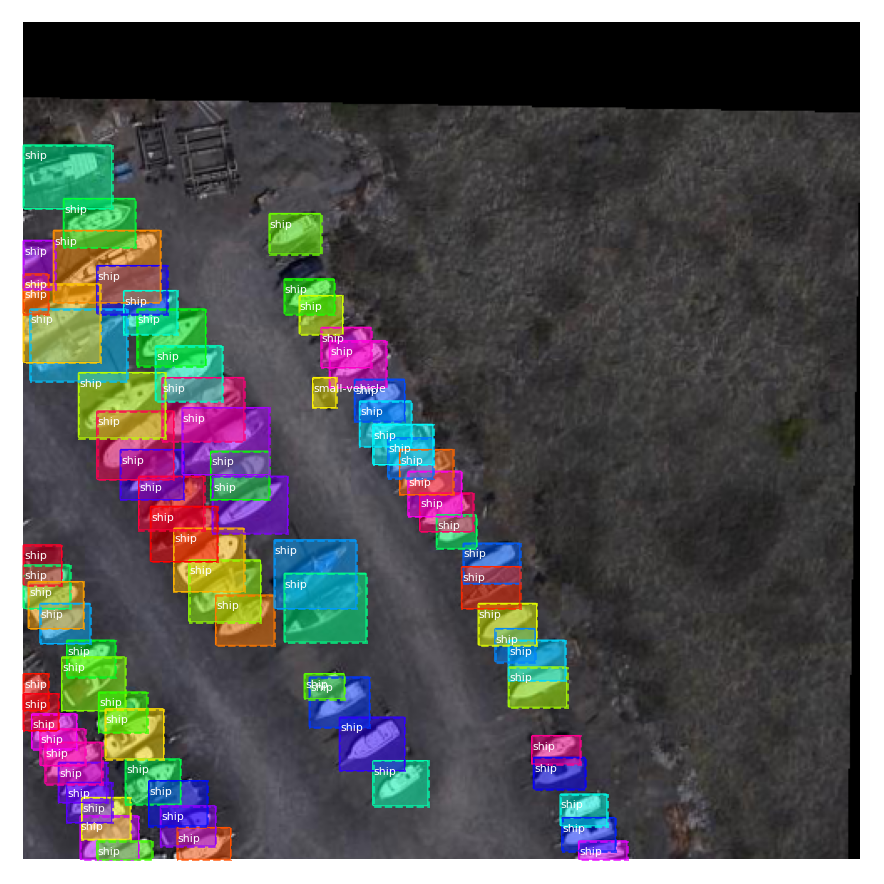

{'id': 'P2189_4', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2189_4.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2189_4.txt'}


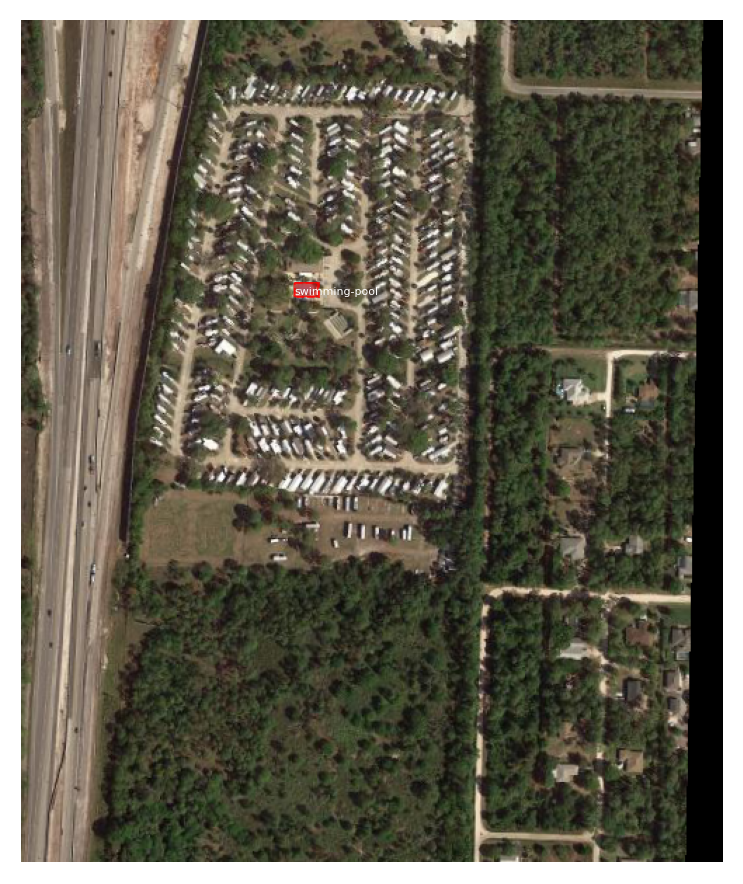

{'id': 'P2225_0', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_0.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2225_0.txt'}


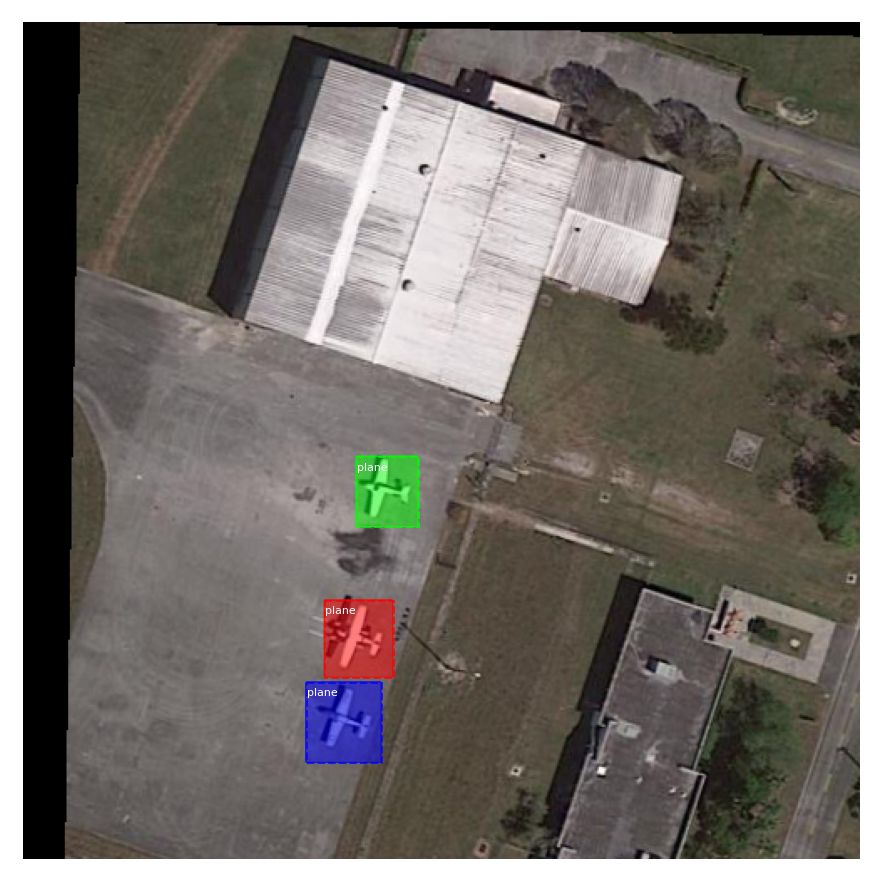

{'id': 'P2225_4', 'source': 'object', 'path': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/images10/P2225_4.png', 'annotation': '/content/drive/MyDrive/DOTA/Dataset/Train/mod/annots10/P2225_4.txt'}


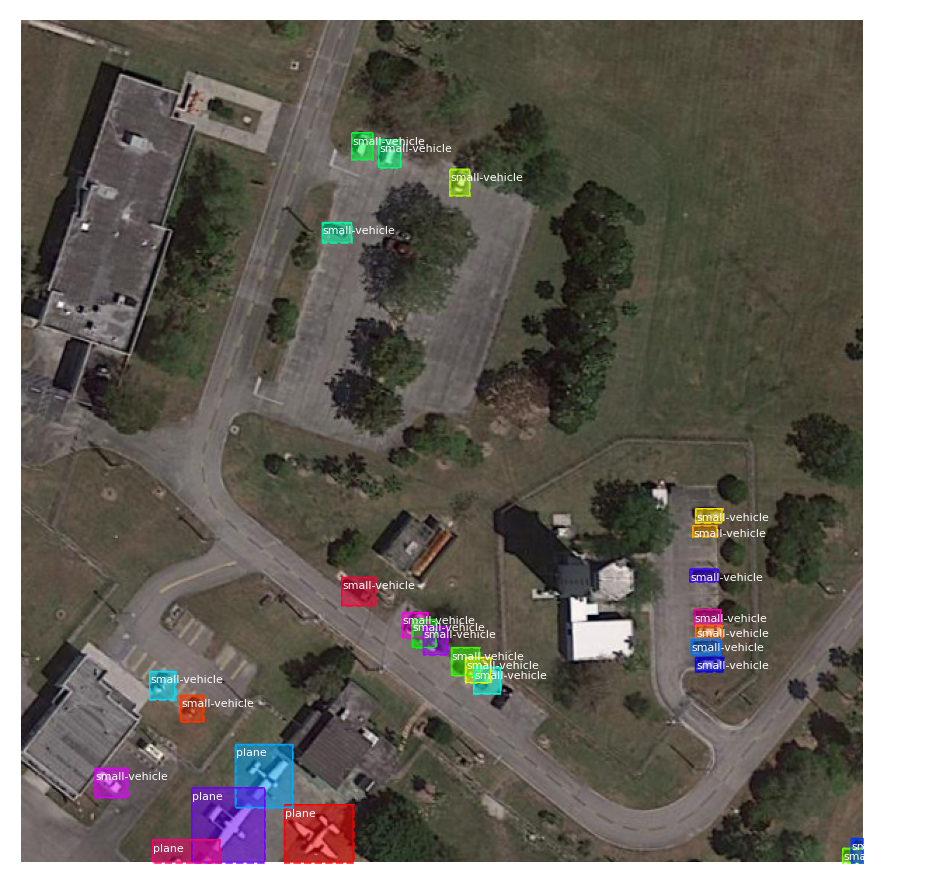


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        1800
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                29
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

In [ ]:
# zbior uczacy
train_set = Dota_data_set()
train_set.load_dataset(is_train=True)
train_set.prepare()
print_data_info(train_set)

# zbior walidacyjny
val_set = Dota_data_set()
val_set.load_dataset(is_train=False)
val_set.prepare()
print_data_info(val_set)

# model
configuration = SA_config()
configuration.display()
# definicja modelu
table_mrcnn = MaskRCNN(mode='training', model_dir=loc_of_out_model, config=configuration)
# zaladowanie wag modelu, usuniecie ostatnich warstw
# table_mrcnn.load_weights(loc_of_model, by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])
table_mrcnn.load_weights(loc_of_model, by_name=True)

In [ ]:
# https://github.com/crowdAI/crowdai-mapping-challenge-mask-rcnn/blob/master/Training.ipynb

In [ ]:
LEARNING_RATE = 0.001

In [ ]:
%%time

table_mrcnn.train(train_set, 
                  val_set,
                  learning_rate=LEARNING_RATE,
                  epochs=40, 
                  layers='heads',
                  )

In [ ]:
%%time

table_mrcnn.train(train_set, 
                  val_set,
                  learning_rate=LEARNING_RATE,
                  epochs=120, 
                  layers='4+'
                  )

In [ ]:
%%time

table_mrcnn.train(train_set, 
                  val_set,
                  learning_rate=LEARNING_RATE/10,
                  epochs=180, 
                  layers='all'
                  )


Starting at epoch 155. LR=0.0001

Checkpoint Path: /content/drive/MyDrive/DOTA/Out_model/sat_aerial_object_detection20211001T1246/mask_rcnn_sat_aerial_object_detection_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a        

/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


/usr/local/lib/python3.7/dist-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'




Epoch 156/160
1000/1000 [==============================] - 3097s 3s/step - loss: 0.5747 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2155 - val_loss: 0.7415 - val_rpn_class_loss: 0.0084 - val_rpn_bbox_loss: 0.2889 - val_mrcnn_class_loss: 0.0390 - val_mrcnn_bbox_loss: 0.1605 - val_mrcnn_mask_loss: 0.2446

Epoch 157/160
1000/1000 [==============================] - 2980s 3s/step - loss: 0.6151 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2192 - val_loss: 0.7210 - val_rpn_class_loss: 0.0105 - val_rpn_bbox_loss: 0.2817 - val_mrcnn_class_loss: 0.0775 - val_mrcnn_bbox_loss: 0.1276 - val_mrcnn_mask_loss: 0.2236
Epoch 158/160
1000/1000 [==============================] - 2978s 3s/step - loss: 0.5740 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.1850 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1147 - mrcnn_mask_loss: 0.2157 - val_loss: 0.9

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/DOTA/Out_model